In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca637.jpeg
/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca3400.jpeg
/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca783.jpeg
/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca3927.jpeg
/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca4109.jpeg
/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca95.jpeg
/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca488.jpeg
/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set/colon_image_sets/colon_aca/colonca2140.jp

In [2]:
import os
from sklearn.model_selection import train_test_split
from PIL import Image

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms


In [3]:
# Kaggle paths
base_dir   = "/kaggle/input/lung-and-colon-cancer-histopathological-images/lung_colon_image_set"
lung_dir   = os.path.join(base_dir, "lung_image_sets")
colon_dir  = os.path.join(base_dir, "colon_image_sets")


In [4]:
# Map each class folder to an integer label
all_roots = [lung_dir, colon_dir]
class_to_idx = {}#map each folder to a num
samples = []#filepath,label

for root in all_roots:
    for class_name in sorted(os.listdir(root)):
        class_folder = os.path.join(root, class_name)
        if not os.path.isdir(class_folder):
            continue
        # assign label if not seen
        if class_name not in class_to_idx:
            class_to_idx[class_name] = len(class_to_idx)
        label = class_to_idx[class_name]
        # walk images
        for fname in os.listdir(class_folder):
            if fname.lower().endswith((".png", ".jpg", ".jpeg")):
                samples.append((
                    os.path.join(class_folder, fname),
                    label
                ))

print(f"Found {len(samples)} images in {len(class_to_idx)} classes")
print("Class  label mapping:", class_to_idx)


Found 25000 images in 5 classes
Class  label mapping: {'lung_aca': 0, 'lung_n': 1, 'lung_scc': 2, 'colon_aca': 3, 'colon_n': 4}


In [5]:
filepaths, labels = zip(*samples)

# 5% test set
fp_trainval, fp_test, lb_trainval, lb_test = train_test_split(
    filepaths, labels,
    test_size=0.05,
    stratify=labels,
    random_state=42
)

#  15% validation
val_ratio = 0.15 / 0.95

fp_train, fp_val, lb_train, lb_val = train_test_split(
    fp_trainval, lb_trainval,
    test_size=val_ratio,
    stratify=lb_trainval,
    random_state=42
)

print("Train:", len(fp_train))
print("Val:  ", len(fp_val))
print("Test: ", len(fp_test))


Train: 20000
Val:   3750
Test:  1250


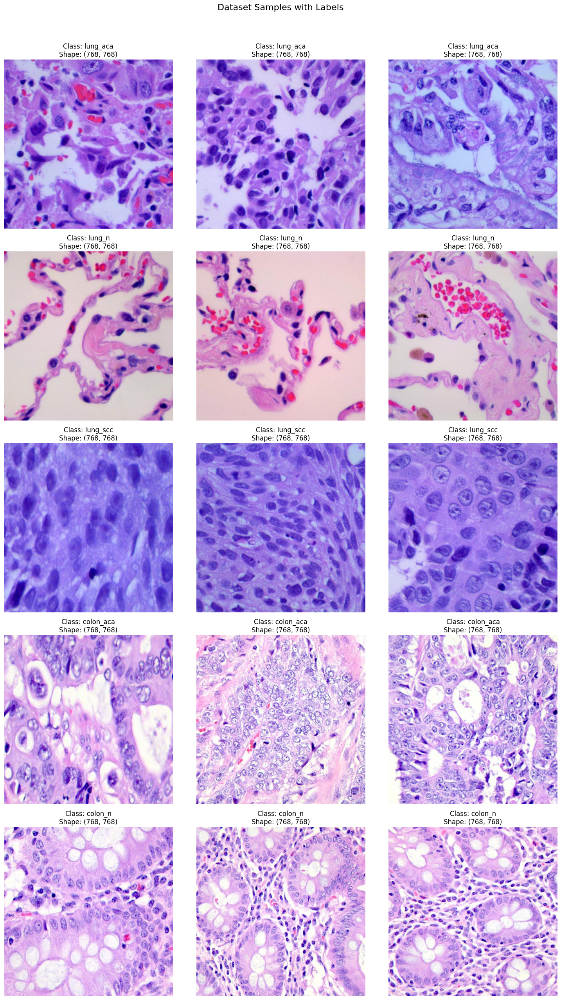

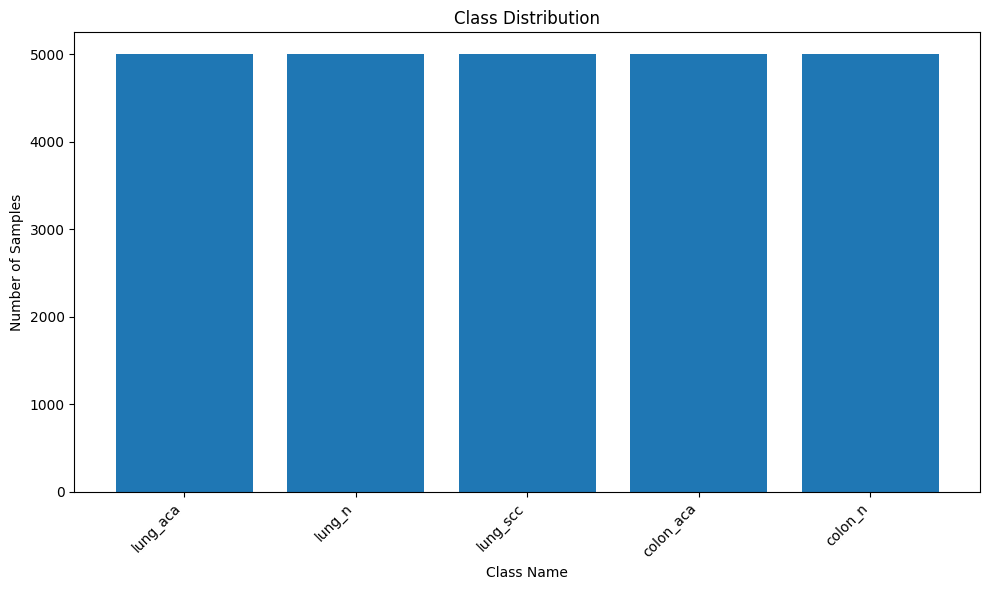

In [6]:
# visualization
import matplotlib.pyplot as plt
import random

num_classes = len(class_to_idx)
fig, axes = plt.subplots(num_classes, 3, figsize=(15, 5*num_classes))
fig.suptitle("Dataset Samples with Labels", fontsize=16, y=1.02)

class_samples = {class_name: [] for class_name in class_to_idx.keys()}

for path, label in samples:
    class_name = list(class_to_idx.keys())[label]
    class_samples[class_name].append(path)

#  3 sample/class
for class_idx, (class_name, paths) in enumerate(class_samples.items()):
    # Randomly select 3 samples per class
    random.shuffle(paths)
    for i in range(3):
        ax = axes[class_idx, i] if num_classes > 1 else axes[i]
        
        if i >= len(paths):  # Handle classes with <3 samples
            ax.axis('off')
            continue
            
        try:
            img = Image.open(paths[i])
            ax.imshow(img)
            ax.set_title(f"Class: {class_name}\nShape: {img.size}")
            ax.axis('off')
        except Exception as e:
            print(f"Error loading {paths[i]}: {str(e)}")
            ax.axis('off')

plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
class_counts = {cls: len(paths) for cls, paths in class_samples.items()}
plt.bar(class_counts.keys(), class_counts.values())
plt.title("Class Distribution")
plt.xlabel("Class Name")
plt.ylabel("Number of Samples")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [7]:
#split into patches

def split_into_patches(img, patch_size):#3xhxw
    _, h, w = img.shape
    patches = img.unfold(1, patch_size, patch_size)\
                 .unfold(2, patch_size, patch_size)
    return patches.contiguous()\
                  .view(-1, 3, patch_size, patch_size) #num of patches,3,patchsize,patchsize

class PatchDataset(torch.utils.data.Dataset):
    def __init__(self, filepaths, labels, transform, patch_size):
        self.filepaths = filepaths
        self.labels    = labels
        self.transform = transform
        self.patch_size = patch_size

    def __len__(self):
        return len(self.filepaths)#len of how many img

    def __getitem__(self, idx):#convert rgb--transform-resize,normalize
        img = Image.open(self.filepaths[idx]).convert("RGB")
        img = self.transform(img)
        patches = split_into_patches(img, self.patch_size)#to slice img
        return patches, self.labels[idx]


In [8]:
patch_size  = 56
batch_size  = 32
num_workers = 2

train_tf = transforms.Compose([
    transforms.RandomResizedCrop(224),#224x224
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],
                         [0.229,0.224,0.225]),
])
test_tf = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],
                         [0.229,0.224,0.225]),
])

train_ds = PatchDataset(fp_train, lb_train, train_tf, patch_size)
val_ds   = PatchDataset(fp_val,   lb_val,   test_tf,  patch_size)
test_ds  = PatchDataset(fp_test,  lb_test,  test_tf,  patch_size)

train_loader = DataLoader(train_ds,  batch_size=batch_size, shuffle=True,  num_workers=num_workers)
val_loader   = DataLoader(val_ds,    batch_size=batch_size, shuffle=False, num_workers=num_workers)
test_loader  = DataLoader(test_ds,   batch_size=batch_size, shuffle=False, num_workers=num_workers)

In [9]:
# ConvNeXt
import torch
import torch.nn as nn
from torchvision import models

class ConvNeXt(nn.Module):
    def __init__(self, patch_size=56, num_classes=len(class_to_idx)):
        super().__init__()
        self.patch_size = patch_size

        # pretrained ConvNeXt Tiny
        self.convnext = models.convnext_tiny(weights='IMAGENET1K_V1')
        
        # first conv stride to match patch processing
        self.convnext.features[0][0].stride = (1, 1)
        
        # get number of features
        num_features = self.convnext.classifier[2].in_features
        
        # replace classifier with standard MLP-its matched with kan dim
        self.convnext.classifier = nn.Sequential(
            nn.Linear(num_features, 256),
            nn.GELU(),  #ConvNeXt uses GELU
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        # Input shape: (batch, num_patches, C, H, W)
        b, n, c, h, w = x.shape
        x = x.view(b*n, c, h, w)
        x = self.convnext.features(x)
        x = self.convnext.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.convnext.classifier(x)
        x = x.view(b, n, -1).mean(1)  # Average across patches
        return x



In [10]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ConvNeXt(patch_size, num_classes=len(class_to_idx)).to(device)

# DataParallel if multiple GPUs
if torch.cuda.device_count() > 1:
    print(f"Using {torch.cuda.device_count()} GPUs")
    model = nn.DataParallel(model)

# Loss & optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

# Mixed precision training
scaler = torch.cuda.amp.GradScaler()

# Unwrap DataParallel if used
base_model = model.module if isinstance(model, nn.DataParallel) else model

# Parameter count
total_params = sum(p.numel() for p in base_model.parameters())
trainable_params = sum(p.numel() for p in base_model.parameters() if p.requires_grad)
non_trainable = total_params - trainable_params

print(f"Total parameters:         {total_params:,}")
print(f"Trainable parameters:     {trainable_params:,}")
print(f"Non-trainable parameters: {non_trainable:,}")
print(f"Approx. parameter size:   {total_params * 4 / (1024**2):.2f} MB")

num_patches = (224 // patch_size) ** 2
example_shape = (1, num_patches, 3, patch_size, patch_size)
print(f"\nExample input shape: {example_shape}")

Downloading: "https://download.pytorch.org/models/convnext_tiny-983f1562.pth" to /root/.cache/torch/hub/checkpoints/convnext_tiny-983f1562.pth
100%|██████████| 109M/109M [00:00<00:00, 209MB/s] 


Using 2 GPUs
Total parameters:         28,016,741
Trainable parameters:     28,016,741
Non-trainable parameters: 0
Approx. parameter size:   106.88 MB

Example input shape: (1, 16, 3, 56, 56)


/tmp/ipykernel_35/986678445.py:14: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()


In [11]:
import threading
import time

def keep_alive():
    while True:
        print("Keeping session alive...", flush=True)
        time.sleep(6000)  # Ping every 60 seconds

# Start the keep-alive thread
t = threading.Thread(target=keep_alive)
t.daemon = True  # Thread will automatically close when main process ends
t.start()


Keeping session alive...


Epoch 1 ▶ Train:   0%|          | 0/625 [00:00<?, ?it/s]/tmp/ipykernel_35/4119414709.py:18: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 1 ▶ Val:   0%|          | 0/118 [00:00<?, ?it/s]/tmp/ipykernel_35/4119414709.py:42: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Epoch 1 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.41it/s]


Epoch 1 Results → Train Loss: 0.7116, Acc: 0.6768 | Val Loss: 0.5927, Acc: 0.7653


Epoch 2 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.43it/s]


Epoch 2 Results → Train Loss: 0.4500, Acc: 0.8073 | Val Loss: 0.3789, Acc: 0.8376


Epoch 3 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.45it/s]


Epoch 3 Results → Train Loss: 0.4197, Acc: 0.8249 | Val Loss: 0.2960, Acc: 0.8920


Epoch 4 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.44it/s]


Epoch 4 Results → Train Loss: 0.3075, Acc: 0.8720 | Val Loss: 0.3392, Acc: 0.8488


Epoch 5 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.42it/s]


Epoch 5 Results → Train Loss: 0.2944, Acc: 0.8802 | Val Loss: 0.1970, Acc: 0.9243


Epoch 6 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.41it/s]


Epoch 6 Results → Train Loss: 0.2801, Acc: 0.8850 | Val Loss: 0.2876, Acc: 0.8752


Epoch 7 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.44it/s]


Epoch 7 Results → Train Loss: 0.2661, Acc: 0.8901 | Val Loss: 0.1539, Acc: 0.9395


Epoch 8 ▶ Train:  76%|███████▋  | 477/625 [09:14<02:51,  1.16s/it]

Keeping session alive...


Epoch 8 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.42it/s]


Epoch 8 Results → Train Loss: 0.2388, Acc: 0.9040 | Val Loss: 0.1877, Acc: 0.9259


Epoch 9 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.41it/s]


Epoch 9 Results → Train Loss: 0.2495, Acc: 0.8995 | Val Loss: 0.1673, Acc: 0.9291


Epoch 10 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.45it/s]


Epoch 10 Results → Train Loss: 0.2244, Acc: 0.9077 | Val Loss: 0.1891, Acc: 0.9200


Epoch 11 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.43it/s]


Epoch 11 Results → Train Loss: 0.2136, Acc: 0.9129 | Val Loss: 0.1574, Acc: 0.9387


Epoch 12 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.44it/s]


Epoch 12 Results → Train Loss: 0.2076, Acc: 0.9149 | Val Loss: 0.1167, Acc: 0.9488


Epoch 13 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.46it/s]


Epoch 13 Results → Train Loss: 0.1977, Acc: 0.9212 | Val Loss: 0.1256, Acc: 0.9485


Epoch 14 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.44it/s]


Epoch 14 Results → Train Loss: 0.1888, Acc: 0.9237 | Val Loss: 0.1351, Acc: 0.9397


Epoch 15 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.44it/s]


Epoch 15 Results → Train Loss: 0.1863, Acc: 0.9233 | Val Loss: 0.1163, Acc: 0.9560


Epoch 16 ▶ Train:  51%|█████     | 320/625 [06:07<05:47,  1.14s/it]

Keeping session alive...


Epoch 16 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.46it/s]


Epoch 16 Results → Train Loss: 0.1830, Acc: 0.9233 | Val Loss: 0.1184, Acc: 0.9507


Epoch 17 ▶ Val: 100%|██████████| 118/118 [00:47<00:00,  2.48it/s]


Epoch 17 Results → Train Loss: 0.1746, Acc: 0.9296 | Val Loss: 0.1293, Acc: 0.9472


Epoch 18 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.43it/s]


Epoch 18 Results → Train Loss: 0.1670, Acc: 0.9307 | Val Loss: 0.1806, Acc: 0.9243


Epoch 19 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.45it/s]


Epoch 19 Results → Train Loss: 0.1662, Acc: 0.9341 | Val Loss: 0.1047, Acc: 0.9616


Epoch 20 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.45it/s]


Epoch 20 Results → Train Loss: 0.1659, Acc: 0.9356 | Val Loss: 0.1398, Acc: 0.9467


Epoch 21 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.44it/s]


Epoch 21 Results → Train Loss: 0.1574, Acc: 0.9366 | Val Loss: 0.0988, Acc: 0.9600


Epoch 22 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.46it/s]


Epoch 22 Results → Train Loss: 0.1527, Acc: 0.9405 | Val Loss: 0.0844, Acc: 0.9640


Epoch 23 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.44it/s]


Epoch 23 Results → Train Loss: 0.1519, Acc: 0.9393 | Val Loss: 0.1154, Acc: 0.9640


Epoch 24 ▶ Train:  38%|███▊      | 236/625 [04:29<07:28,  1.15s/it]

Keeping session alive...


Epoch 24 ▶ Val: 100%|██████████| 118/118 [00:47<00:00,  2.47it/s]


Epoch 24 Results → Train Loss: 0.1457, Acc: 0.9417 | Val Loss: 0.0702, Acc: 0.9712


Epoch 25 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.46it/s]


Epoch 25 Results → Train Loss: 0.1475, Acc: 0.9419 | Val Loss: 0.0845, Acc: 0.9680


Epoch 26 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.45it/s]


Epoch 26 Results → Train Loss: 0.1468, Acc: 0.9401 | Val Loss: 0.0952, Acc: 0.9675


Epoch 27 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.45it/s]


Epoch 27 Results → Train Loss: 0.1436, Acc: 0.9428 | Val Loss: 0.1151, Acc: 0.9592


Epoch 28 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.44it/s]


Epoch 28 Results → Train Loss: 0.1408, Acc: 0.9443 | Val Loss: 0.0664, Acc: 0.9739


Epoch 29 ▶ Val: 100%|██████████| 118/118 [00:47<00:00,  2.46it/s]


Epoch 29 Results → Train Loss: 0.1409, Acc: 0.9450 | Val Loss: 0.0887, Acc: 0.9624


Epoch 30 ▶ Val: 100%|██████████| 118/118 [00:47<00:00,  2.46it/s]


Epoch 30 Results → Train Loss: 0.1306, Acc: 0.9476 | Val Loss: 0.0993, Acc: 0.9608


Epoch 31 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.44it/s]


Epoch 31 Results → Train Loss: 0.1296, Acc: 0.9493 | Val Loss: 0.2392, Acc: 0.9021


Epoch 32 ▶ Train:  27%|██▋       | 168/625 [03:10<08:41,  1.14s/it]

Keeping session alive...


Epoch 32 ▶ Val: 100%|██████████| 118/118 [00:47<00:00,  2.46it/s]


Epoch 32 Results → Train Loss: 0.1376, Acc: 0.9455 | Val Loss: 0.0644, Acc: 0.9747


Epoch 33 ▶ Val: 100%|██████████| 118/118 [00:47<00:00,  2.46it/s]


Epoch 33 Results → Train Loss: 0.1313, Acc: 0.9488 | Val Loss: 0.0862, Acc: 0.9699


Epoch 34 ▶ Val: 100%|██████████| 118/118 [00:47<00:00,  2.49it/s]


Epoch 34 Results → Train Loss: 0.1262, Acc: 0.9493 | Val Loss: 0.0993, Acc: 0.9573


Epoch 35 ▶ Val: 100%|██████████| 118/118 [00:47<00:00,  2.47it/s]


Epoch 35 Results → Train Loss: 0.1301, Acc: 0.9497 | Val Loss: 0.0823, Acc: 0.9691


Epoch 36 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.45it/s]


Epoch 36 Results → Train Loss: 0.1288, Acc: 0.9496 | Val Loss: 0.0884, Acc: 0.9659


Epoch 37 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.45it/s]


Epoch 37 Results → Train Loss: 0.1295, Acc: 0.9498 | Val Loss: 0.0635, Acc: 0.9739


Epoch 38 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.44it/s]


Epoch 38 Results → Train Loss: 0.1258, Acc: 0.9497 | Val Loss: 0.0790, Acc: 0.9675


Epoch 39 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.45it/s]


Epoch 39 Results → Train Loss: 0.1157, Acc: 0.9529 | Val Loss: 0.0785, Acc: 0.9677


Epoch 40 ▶ Train:  19%|█▉        | 119/625 [02:14<09:23,  1.11s/it]

Keeping session alive...


Epoch 40 ▶ Val: 100%|██████████| 118/118 [00:47<00:00,  2.47it/s]


Epoch 40 Results → Train Loss: 0.1176, Acc: 0.9535 | Val Loss: 0.0500, Acc: 0.9789


Epoch 41 ▶ Val: 100%|██████████| 118/118 [00:47<00:00,  2.49it/s]


Epoch 41 Results → Train Loss: 0.1203, Acc: 0.9526 | Val Loss: 0.0714, Acc: 0.9725


Epoch 42 ▶ Val: 100%|██████████| 118/118 [00:48<00:00,  2.43it/s]


Epoch 42 Results → Train Loss: 0.1159, Acc: 0.9544 | Val Loss: 0.0674, Acc: 0.9757


Epoch 43 ▶ Val: 100%|██████████| 118/118 [00:47<00:00,  2.46it/s]


Epoch 43 Results → Train Loss: 0.1335, Acc: 0.9497 | Val Loss: 0.0929, Acc: 0.9584


Epoch 44 ▶ Val: 100%|██████████| 118/118 [00:47<00:00,  2.49it/s]


Epoch 44 Results → Train Loss: 0.1085, Acc: 0.9573 | Val Loss: 0.0522, Acc: 0.9779


Epoch 45 ▶ Val: 100%|██████████| 118/118 [00:47<00:00,  2.46it/s]


Epoch 45 Results → Train Loss: 0.1114, Acc: 0.9553 | Val Loss: 0.0613, Acc: 0.9757


Epoch 46 ▶ Val: 100%|██████████| 118/118 [00:47<00:00,  2.48it/s]


Epoch 46 Results → Train Loss: 0.1097, Acc: 0.9574 | Val Loss: 0.0429, Acc: 0.9840


Epoch 47 ▶ Val: 100%|██████████| 118/118 [00:47<00:00,  2.47it/s]


Epoch 47 Results → Train Loss: 0.1094, Acc: 0.9576 | Val Loss: 0.0664, Acc: 0.9733


Epoch 48 ▶ Train:  17%|█▋        | 104/625 [01:56<09:50,  1.13s/it]

Keeping session alive...


Epoch 48 ▶ Val: 100%|██████████| 118/118 [00:47<00:00,  2.49it/s]


Epoch 48 Results → Train Loss: 0.1075, Acc: 0.9571 | Val Loss: 0.0571, Acc: 0.9776


Epoch 49 ▶ Val: 100%|██████████| 118/118 [00:47<00:00,  2.47it/s]


Epoch 49 Results → Train Loss: 0.1094, Acc: 0.9578 | Val Loss: 0.0586, Acc: 0.9811


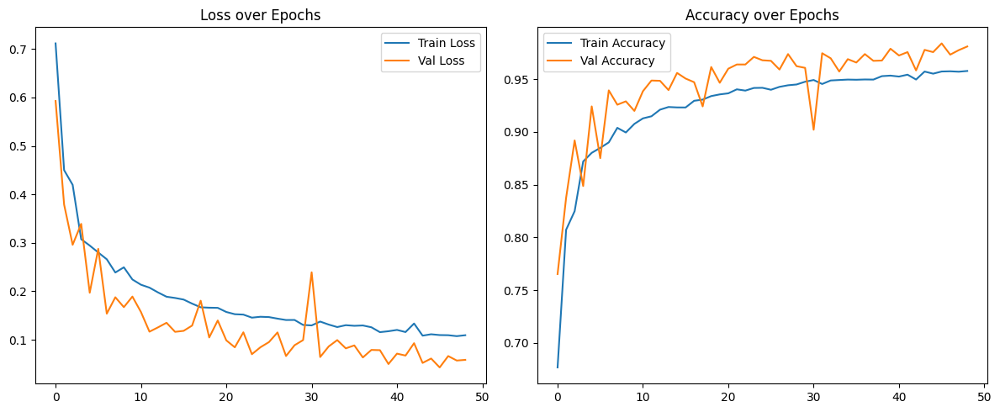

Test Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]/tmp/ipykernel_35/4119414709.py:84: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
Test Evaluation: 100%|██████████| 40/40 [00:16<00:00,  2.41it/s]


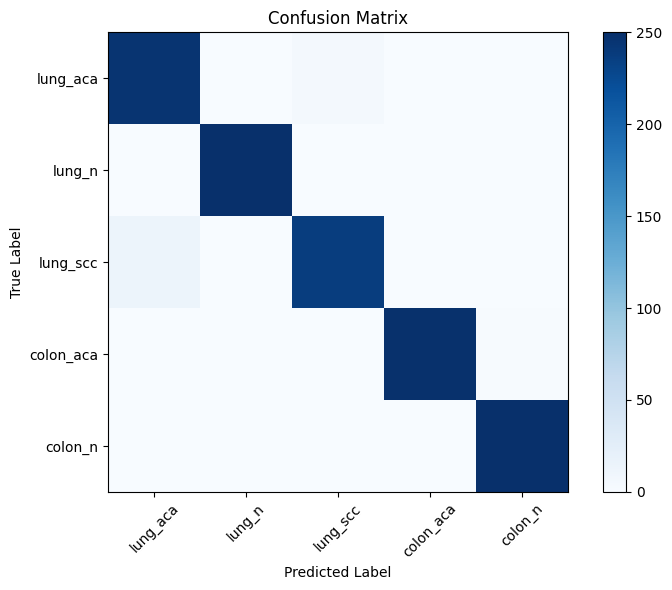


Classification Report:
              precision    recall  f1-score   support

    lung_aca       0.95      0.98      0.97       250
      lung_n       1.00      1.00      1.00       250
    lung_scc       0.98      0.95      0.97       250
   colon_aca       1.00      1.00      1.00       250
     colon_n       1.00      1.00      1.00       250

    accuracy                           0.99      1250
   macro avg       0.99      0.99      0.99      1250
weighted avg       0.99      0.99      0.99      1250

Model saved successfully.


In [12]:
# Training
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
from tqdm import tqdm

train_losses, val_losses = [], []
train_accs, val_accs = [], []

for epoch in range(1, 50):  
    # Training
    model.train()
    running_loss = running_correct = 0
    
    for patches, labels in tqdm(train_loader, desc=f"Epoch {epoch} ▶ Train"):
        patches, labels = patches.to(device), labels.to(device)
        optimizer.zero_grad()
        
        with torch.cuda.amp.autocast():
            outputs = model(patches)
            loss = criterion(outputs, labels)
        
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        
        running_loss += loss.item() * labels.size(0)
        running_correct += (outputs.argmax(1) == labels).sum().item()
    
    train_loss = running_loss / len(train_ds)
    train_acc = running_correct / len(train_ds)
    train_losses.append(train_loss)
    train_accs.append(train_acc)
    
    # Validation
    model.eval()
    running_loss = running_correct = 0
    
    with torch.no_grad():
        for patches, labels in tqdm(val_loader, desc=f"Epoch {epoch} ▶ Val"):
            patches, labels = patches.to(device), labels.to(device)
            
            with torch.cuda.amp.autocast():
                outputs = model(patches)
                loss = criterion(outputs, labels)
            
            running_loss += loss.item() * labels.size(0)
            running_correct += (outputs.argmax(1) == labels).sum().item()
    
    val_loss = running_loss / len(val_ds)
    val_acc = running_correct / len(val_ds)
    val_losses.append(val_loss)
    val_accs.append(val_acc)
    
    print(f"Epoch {epoch} Results → "
          f"Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f}")

#Eval
# Plot training curves
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.title('Loss over Epochs')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accs, label='Train Accuracy')
plt.plot(val_accs, label='Val Accuracy')
plt.title('Accuracy over Epochs')
plt.legend()
plt.tight_layout()
plt.show()

# Test evaluation
model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for patches, labels in tqdm(test_loader, desc="Test Evaluation"):
        patches = patches.to(device)
        
        with torch.cuda.amp.autocast():
            outputs = model(patches)
        
        preds = torch.argmax(outputs, dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.numpy())

# Confusion matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_to_idx))
plt.xticks(tick_marks, class_to_idx.keys(), rotation=45)
plt.yticks(tick_marks, class_to_idx.keys())
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.tight_layout()
plt.show()

# Classification report
print("\nClassification Report:")
print(classification_report(all_labels, all_preds, target_names=list(class_to_idx.keys())))

# Save model
torch.save(model.state_dict(), 'convnext_standard_lung_colon.pth')
print("Model saved successfully.")